In [1]:
import os, json
os.makedirs('config/', exist_ok=True)

In [18]:
pip install seaborn==0.12.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 1.5 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.2
    Uninstalling seaborn-0.13.2:
      Successfully uninstalled seaborn-0.13.2
Note: you may need to restart the kernel to use updated packages.


Next thing is to upload your filepaths.json file into your config folder

In [3]:
# open the json
with open('config/filepaths.json', 'r') as f:
    FPATHS = json.load(f)

FPATHS

{'data': {'raw': {'full': 'Data/loan_approval.csv'},
  'ml': {'train': 'Data/train.joblib', 'test': 'Data/test.joblib'},
  'nlp': {'nlp_full': 'Data/nlp/nlp_full.csv'}},
 'models': {'logistic_regression': 'models/logreg_pipe.joblib',
  'random_forest': 'models/rf_pipe.joblib'},
 'images': {'banner': 'Images/money_tree.jpg'}}

In [4]:
from pprint import pprint
pprint(FPATHS)

{'data': {'ml': {'test': 'Data/test.joblib', 'train': 'Data/train.joblib'},
          'nlp': {'nlp_full': 'Data/nlp/nlp_full.csv'},
          'raw': {'full': 'Data/loan_approval.csv'}},
 'images': {'banner': 'Images/money_tree.jpg'},
 'models': {'logistic_regression': 'models/logreg_pipe.joblib',
            'random_forest': 'models/rf_pipe.joblib'}}


In [5]:
import os
def create_directories_from_paths(nested_dict):
    """OpenAI. (2023). ChatGPT [Large language model]. https://chat.openai.com 
    Recursively create directories for file paths in a nested dictionary.
    Parameters:
    nested_dict (dict): The nested dictionary containing file paths.
    """
    for key, value in nested_dict.items():
        if isinstance(value, dict):
            # If the value is a dictionary, recurse into it
            create_directories_from_paths(value)
        elif isinstance(value, str):
            # If the value is a string, treat it as a file path and get the directory path
            directory_path = os.path.dirname(value)
            # If the directory path is not empty and the directory does not exist, create it
            if directory_path and not os.path.exists(directory_path):
                os.makedirs(directory_path)
                print(f"Directory created: {directory_path}")

# Use the function on your FPATHS dictionary
create_directories_from_paths(FPATHS)

In [6]:
FPATHS['data']['raw']['full']

'Data/loan_approval.csv'

In [7]:
import pandas as pd
df = pd.read_csv(FPATHS['data']['raw']['full'])
df.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [8]:
import joblib
# Load training data with FPATHS dictionary
X_train, y_train = joblib.load(FPATHS['data']['ml']['train'])
X_train

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
3977,5,Graduate,Yes,7600000,18000000,12,452,7900000,4300000,23800000,4700000
2425,0,Not Graduate,No,6000000,22900000,16,302,12200000,6500000,17700000,7100000
1545,2,Not Graduate,Yes,8200000,27800000,16,827,11500000,8700000,26000000,10700000
173,2,Not Graduate,Yes,7400000,28200000,8,376,21900000,5000000,17400000,5200000
3405,1,Graduate,Yes,3400000,7000000,4,534,3100000,1600000,13000000,4000000
...,...,...,...,...,...,...,...,...,...,...,...
3444,0,Graduate,Yes,1300000,4700000,16,530,3200000,1000000,3800000,800000
466,5,Not Graduate,Yes,500000,1800000,18,411,1000000,500000,1300000,200000
3092,4,Not Graduate,Yes,8600000,20600000,16,449,10800000,10600000,28700000,5400000
3772,2,Not Graduate,Yes,7000000,21400000,12,541,3700000,1300000,19800000,9600000


In [3]:
sns.__version__

'0.12.2'

In [2]:
import seaborn as sns

In [10]:
# Functionalize loading train or test
def load_Xy_data(fpath):
    return joblib.load(fpath)

In [11]:
X_test, y_test = load_Xy_data(fpath = FPATHS['data']['ml']['test'])
X_test.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
1703,5,Graduate,No,5400000,19700000,20,423,6500000,10000000,15700000,7300000
1173,2,Graduate,No,5900000,14000000,8,599,4700000,9500000,17800000,6700000
308,3,Graduate,No,9600000,19900000,14,452,4200000,16200000,28500000,6600000
1322,2,Graduate,No,6200000,23400000,8,605,10000000,10800000,21800000,9200000
3271,3,Not Graduate,Yes,5800000,14100000,12,738,11700000,4400000,15400000,8400000


In [12]:
rf_model = joblib.load(FPATHS['models']['random_forest'])
rf_model

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['education', 'self_employed'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=42))])

In [13]:
# Functionalize loading in a model
def load_model_ml(fpath):
    return joblib.load(fpath)

In [14]:
logreg = load_model_ml(fpath = FPATHS['models']['logistic_regression'])
logreg

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['education', 'self_employed'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('logisticregression',
                 LogisticRegression(class_weight='balanced'))])

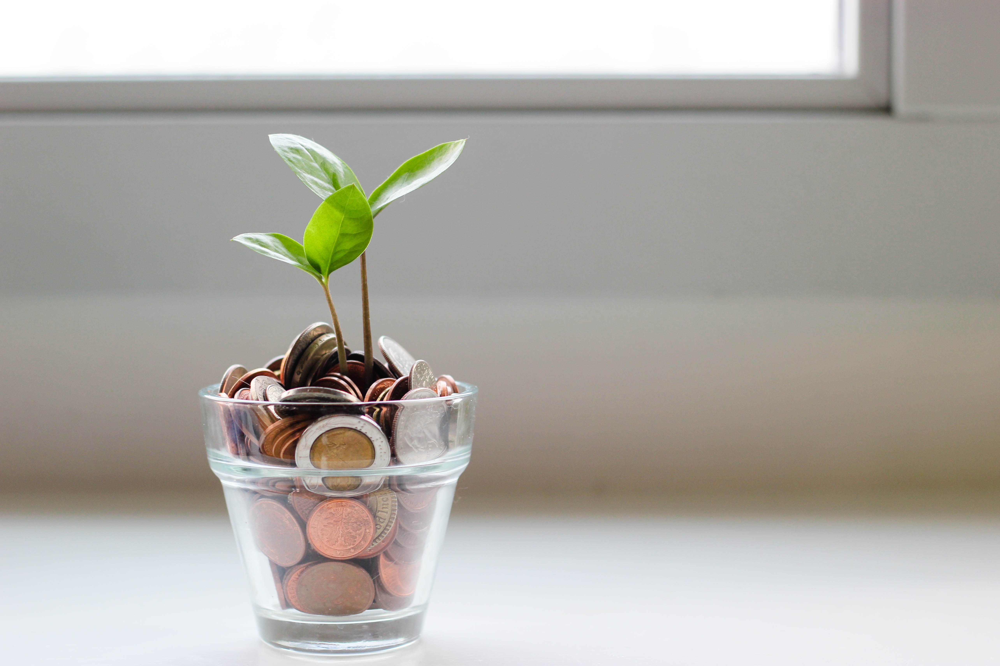

In [15]:
from IPython.display import display
from PIL import Image
image = Image.open(FPATHS['images']['banner'])
display(image)